# Dry Bean Classifier

## Librerías 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Manejo de rutas
import sys
sys.path.append("..")
import modules.utils.paths as path

# Manipulación de datos
import pandas as pd
import numpy as np

# Visualización de datos
import seaborn as sns
import matplotlib.pyplot as plt

# Pre-procesamiento, estandarización y modelo 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import  accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler

# Limpieza
import janitor

sns.set()

## Lectura de datos

In [3]:
file_path = path.data_raw_dir("Dry_Bean.csv")
beans_df = pd.read_csv(file_path)
print(beans_df.shape)
beans_df.head()

(13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


Verificamos que la varaible `Class` cuente con +2 clases (multi-clase).

In [4]:
beans_df["Class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

## Limpieza de datos

Estandariación del nombre de las variables

In [5]:
beans_df = beans_df.clean_names(case_type="snake")
beans_df.columns

Index(['area', 'perimeter', 'major_axis_length', 'minor_axis_length',
       'aspect_ration', 'eccentricity', 'convex_area', 'equiv_diameter',
       'extent', 'solidity', 'roundness', 'compactness', 'shape_factor1',
       'shape_factor2', 'shape_factor3', 'shape_factor4', 'class'],
      dtype='object')

### Duplicados

In [6]:
beans_df.duplicated().sum()

68

In [7]:
beans_df.columns[:-1]

Index(['area', 'perimeter', 'major_axis_length', 'minor_axis_length',
       'aspect_ration', 'eccentricity', 'convex_area', 'equiv_diameter',
       'extent', 'solidity', 'roundness', 'compactness', 'shape_factor1',
       'shape_factor2', 'shape_factor3', 'shape_factor4'],
      dtype='object')

In [8]:
beans_df.duplicated().sum()

68

In [9]:
beans_df.drop_duplicates(inplace=True)
print("Duplicados:", beans_df.duplicated().sum())
print("Observaciones:", beans_df.shape[0])

Duplicados: 0
Observaciones: 13543


### Manejo de valores nulos

In [10]:
beans_df.isnull().sum()

area                 0
perimeter            0
major_axis_length    0
minor_axis_length    0
aspect_ration        0
eccentricity         0
convex_area          0
equiv_diameter       0
extent               0
solidity             0
roundness            0
compactness          0
shape_factor1        0
shape_factor2        0
shape_factor3        0
shape_factor4        0
class                0
dtype: int64

### Cambio de tipo de datos

In [11]:
beans_df["class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [12]:
beans_dict = {
  "SEKER": 1,
  "BARBUNYA": 2,
  "BOMBAY": 3,
  "CALI": 4,
  "HOROZ": 5,
  "SIRA": 6,
  "DERMASON": 7
}

beans_df["class_num"] = beans_df["class"].apply(lambda x: beans_dict[x])
beans_df.head()

,area,perimeter,major_axis_length,minor_axis_length,aspect_ration,eccentricity,convex_area,equiv_diameter,extent,solidity,roundness,compactness,shape_factor1,shape_factor2,shape_factor3,shape_factor4,class,class_num
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER,1
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER,1
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER,1
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER,1
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER,1


## Análisis Exploratorio de Datos

### Distribución de la variable categoríca (target) `class`.

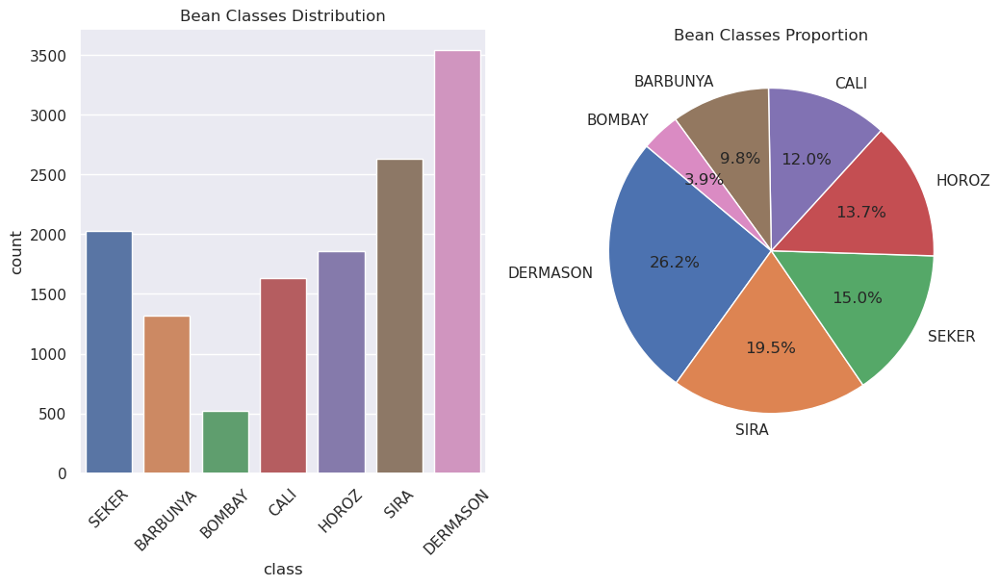

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6))

sns.countplot(
  data=beans_df,
  x="class",
  ax=axes[0]
)

axes[0].tick_params(axis='x', rotation=45)
axes[0].set_title("Bean Classes Distribution")

(
  beans_df["class"]
    .value_counts()
    .plot(
      kind="pie",
      ax=axes[1],
      title="Bean Classes Proportion",
      ylabel="",
      autopct="%1.1f%%",
      startangle=140
    )
)

plt.show()

**Observciones**:
- Claro desbalance entre todas las clases.
- Clase predominante `DERMASON`
- Clase minoritaria `BOMBAY`
- La diferencia entre la clase predominante y la minoritaria es de +3000 observaciones.

Para entrenar el modelo de Regresión Logística se debe contar con un dataset balanceado, por lo tanto debemos aplicar técnicas de balanceo de datos, ya se de sobremuestreo (aumento de observaciones de las clases minoritarias) o de submuestreo (eliminación de observaciones de las clases predominantes).

O bien es posible implementar una combianción de ambas técnicas con un Pipeline.

### Análisis de correlaciones

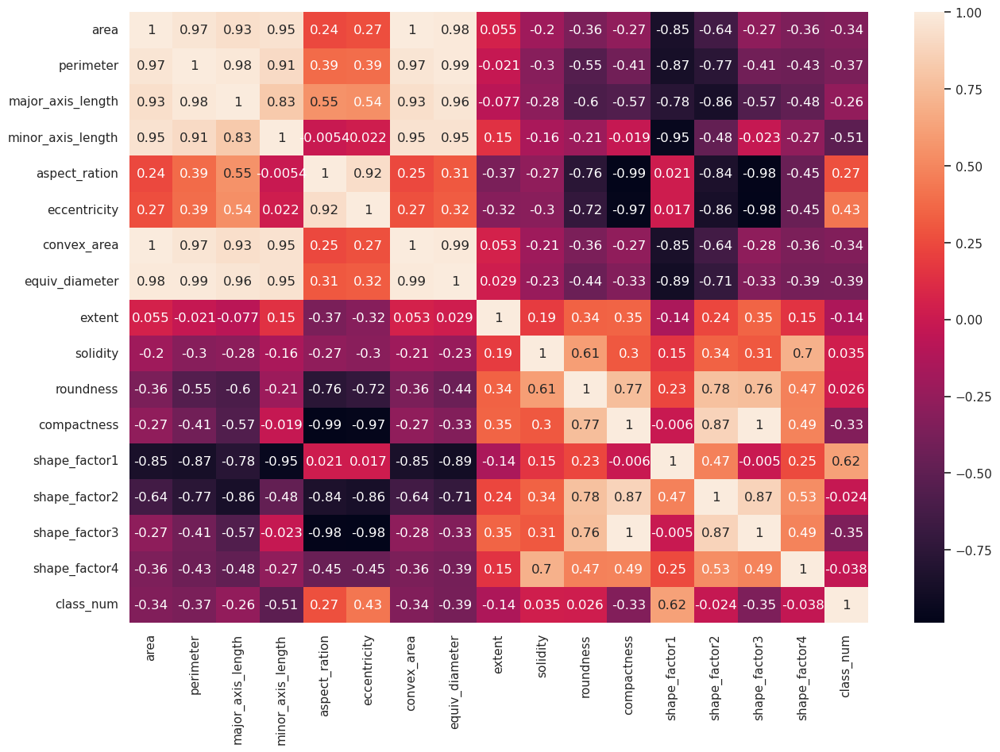

In [14]:
corr = beans_df.corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True)
plt.show()

**Observaciones**
- En general encontramos varias características correlacionadas entre si.
- Las características  `convex_area` y `equiv_diameter` son las que aportan mayor correlación a la variable `area`, lo cuál puede indicar que esas 3 variables describan lo mismo.

📌 Eliminaresmos las variables `convex_area` y `equiv_diameter`.

In [15]:
processed_df = beans_df.drop(columns=["convex_area", "equiv_diameter"])

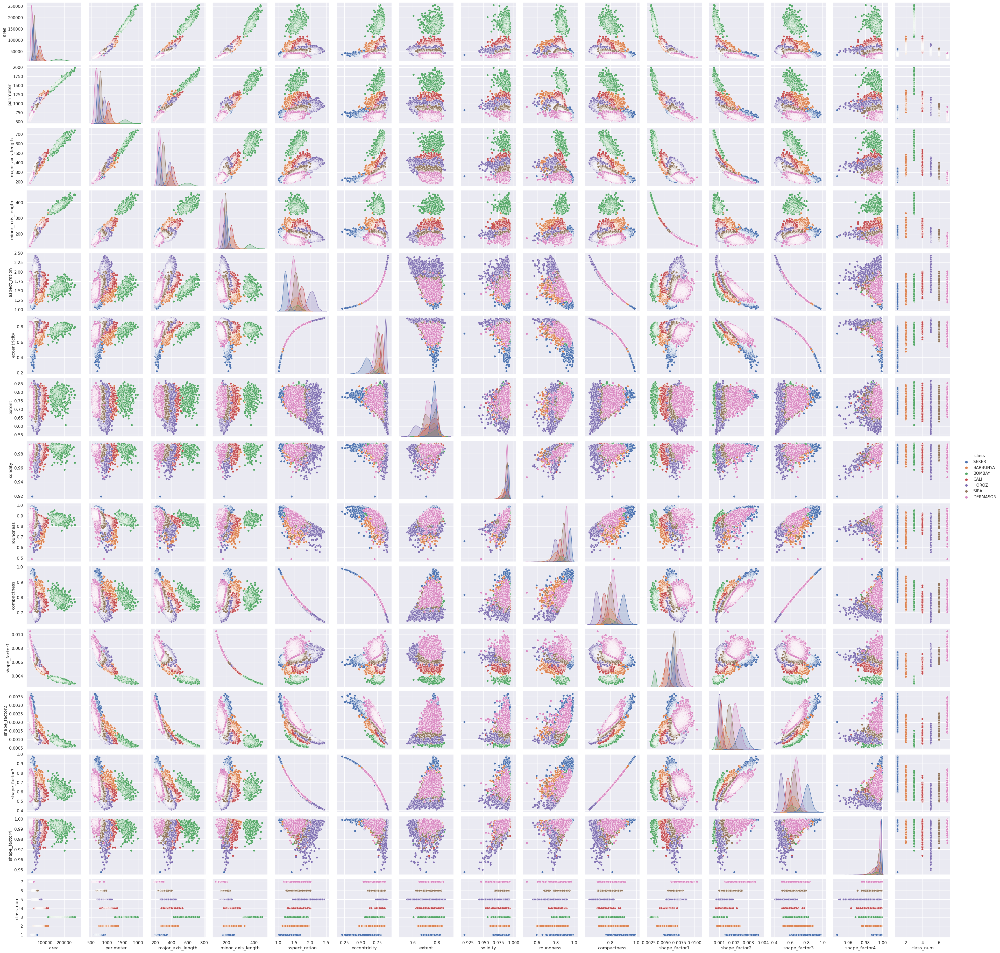

In [16]:
sns.pairplot(processed_df, hue="class")
plt.show()